## Notebook checkpoint

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline
import os
import math
import pickle

In [5]:
import operator
import random
import time

In [3]:
with open('calibration.p', 'rb') as f:
    (CAMERA_MATRIX, DISTORTION_COEFFS, WARPER_MATRICES, UNWARPER_MATRICES, TEST_IMAGE_SOLUTIONS) = pickle.load(f)

def undistort(img):
    return cv2.undistort(img, CAMERA_MATRIX, DISTORTION_COEFFS, None, CAMERA_MATRIX)

def warp(img, M):
    return cv2.warpPerspective(img, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

## Detect points with high gradients or high color saturation

### Color

In [4]:
def test_color_threshs():
    test_image_solutions_inds = np.linspace(0, len(TEST_IMAGE_SOLUTIONS) - 1, num=7, dtype=np.uint8)
    test_image_solutions_getter = operator.itemgetter(*test_image_solutions_inds)
    test_image_solutions = list(test_image_solutions_getter(TEST_IMAGE_SOLUTIONS))
    
    ch_to_threshcombo_to_stats = {}
    
    for warp_category, image_path, ploty, _, l_plotx_lo, l_plotx_hi, _, r_plotx_lo, r_plotx_hi in test_image_solutions:
        orig_rgb = cv2.imread(image_path)[:,:,::-1]
        undistorted_rgb = undistort(orig_rgb)
        undistorted_hls = cv2.cvtColor(undistorted_rgb, cv2.COLOR_RGB2HLS)
        
        thresholding = [
            ('rch', undistorted_rgb[:,:,0], np.linspace(110, 200, num=4, dtype=np.uint8), [999]),
#             ('gch', undistorted_rgb[:,:,1], np.linspace(10, 100, num=3, dtype=np.uint8), np.linspace(100, 200, num=3, dtype=np.uint8)),
            ('hch', undistorted_hls[:,:,0], [10, 20], [30, 80, 130]),
            ('lch', undistorted_hls[:,:,1], np.linspace(210, 255, num=4, dtype=np.uint8), [999]),
            ('sch', undistorted_hls[:,:,2], np.linspace(130, 200, num=4, dtype=np.uint8), [999])
        ]
        
        num_relevant_elements = len(ploty) * (l_plotx_hi[0] - l_plotx_lo[0]) * 2
        
        for ch_name, single_ch, thresh_lows, thresh_highs in thresholding:
        
            thresh_combos = np.array(np.meshgrid(thresh_lows, thresh_highs)).reshape(2, -1).T
            for thresh_low, thresh_high in thresh_combos:
            
                print(str((image_path, ch_name, thresh_low, thresh_high)).ljust(100), end='\r')

                bin_combined = np.zeros(undistorted_rgb.shape[:2], dtype=np.uint8)
                bin_combined[(single_ch >= thresh_low) & (single_ch <= thresh_high)] = 1

                bin_warped = warp(bin_combined, WARPER_MATRICES[warp_category])

                positive_coords_y, positive_coords_x = bin_warped.nonzero()
                if len(positive_coords_y) == 0:
                    continue

                num_true_positives = 0
                for y, x in zip(positive_coords_y, positive_coords_x):
                    if ((x >= l_plotx_lo[y] and x <= l_plotx_hi[y]) or
                        (x >= r_plotx_lo[y] and x <= r_plotx_hi[y])):
                        num_true_positives += 1
                precision = num_true_positives / len(positive_coords_y)
                
                recall = num_true_positives / num_relevant_elements
                
                stat = (precision, recall)

                threshcombo_to_stats = ch_to_threshcombo_to_stats.get(ch_name, {})
                threshcombo_key = (thresh_low, thresh_high)
                stats = threshcombo_to_stats.get(threshcombo_key, [])
                stats.append(stat)
                threshcombo_to_stats[threshcombo_key] = stats
                ch_to_threshcombo_to_stats[ch_name] = threshcombo_to_stats

    return ch_to_threshcombo_to_stats

COLOR_THRESH_STATS = test_color_threshs()
print('done'.ljust(100))

done                                                                                                


In [20]:
def merge_stats_with_archived(archived, current):
    """Modifies `archived`."""
    
    for ch, threshcombo_to_stats in current.items():
        threshcombo_to_stats_archived = archived.get(ch, {})
        archived[ch] = threshcombo_to_stats_archived
        
        for threshcombo, stats in threshcombo_to_stats.items():
            stats_archived = threshcombo_to_stats_archived.get(threshcombo, [])
            threshcombo_to_stats_archived[threshcombo] = stats_archived
            stats_archived.extend(stats)

def archive_stats(fname_pre, curr_stats = {}):
    unmerged_fname = '{}.unmerged.{}.p'.format(fname_pre, time.time())
    with open(unmerged_fname, 'wb') as f:
        pickle.dump(curr_stats, f)
    
    archive_fname = '{}.p'.format(fname_pre)
    if os.path.isfile(archive_fname):
        with open(archive_fname, 'rb') as f:
            archived_stats = pickle.load(f)
    else:
        archived_stats = {}
    
    merge_stats_with_archived(archived_stats, curr_stats)
    
    bak_fname = '{}.{}.bak.p'.format(fname_pre, time.time())
    for fname in [bak_fname, archive_fname]:
        with open(fname, 'wb') as f:
            pickle.dump(archived_stats, f)
    
    return archived_stats

In [21]:
COLOR_THRESH_STATS = archive_stats('color_thresh_stats', COLOR_THRESH_STATS)

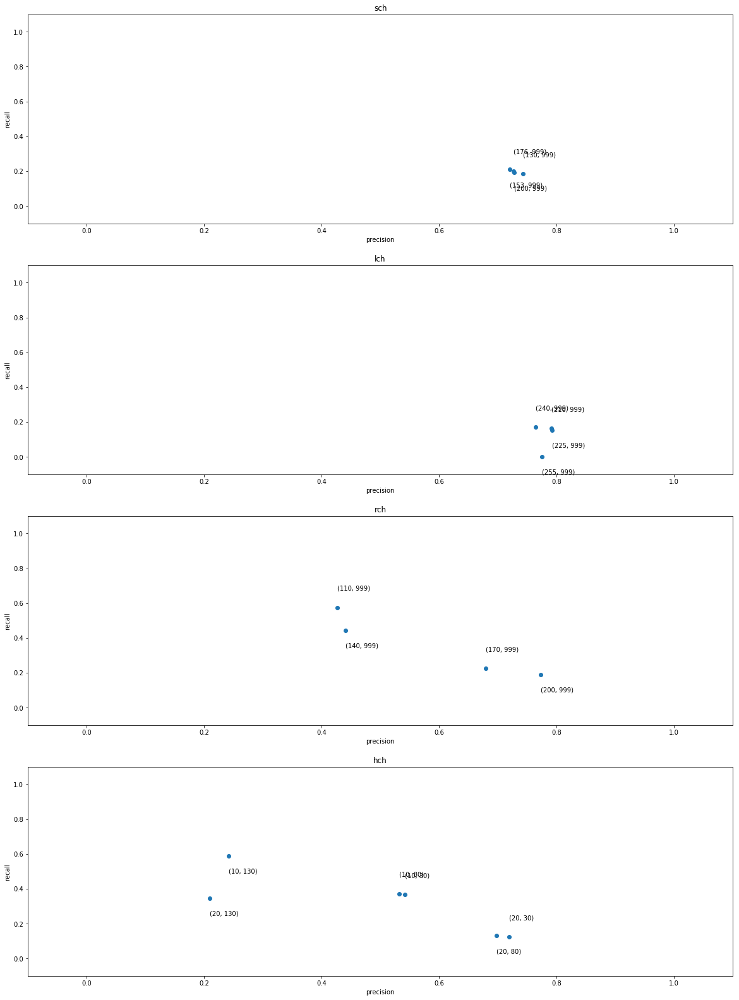

In [13]:
def analyze_thresh_stats(thresh_stats):
    fig, axes = plt.subplots(len(thresh_stats), figsize=(20, 7 * len(thresh_stats)))
    
    for (descr, threshcombo_to_stats), ax in zip(thresh_stats.items(), axes):
        temp = np.array(list(threshcombo_to_stats.items()))
        threshcombos = temp[:,0]
        
        mean_stats = []
        for stats_over_one_test_image in temp[:,1]:
            mean_stats.append(np.mean(stats_over_one_test_image, axis=0))
        mean_stats = np.array(mean_stats)
        
        precisions = mean_stats[:,0]
        recalls = mean_stats[:,1]
        
        ax.scatter(precisions, recalls)
        ax.set_xlabel('precision')
        ax.set_ylabel('recall')
        ax.set_xlim(-0.1, 1.1)
        ax.set_ylim(-0.1, 1.1)
        ax.set_title(descr)
        
        for threshcombo, (precision, recall), ind in zip(threshcombos, mean_stats, range(99)):
            if ind % 2 == 0:
                y_offset = 0.1
            else:
                y_offset = -0.1
            ax.text(precision, recall + y_offset, str(threshcombo))

analyze_thresh_stats(COLOR_THRESH_STATS)

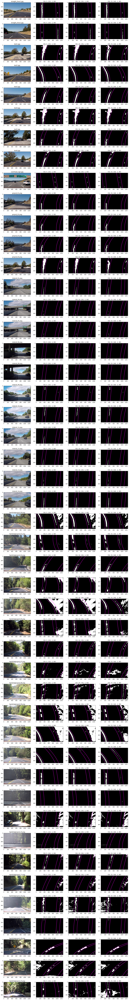

In [33]:
def color_thresh_test_images():
    configs = [(50, 5, 120, -1, 90),
               (50, 10, 130, -1, 90),
               (50, 15, 140, -1, 90)]
    
    fig, axes = plt.subplots(ncols=(len(configs) + 1), nrows=len(TEST_IMAGE_SOLUTIONS), figsize=(20, 3.5 * len(TEST_IMAGE_SOLUTIONS)))
    
    for (warp_category, image_path, ploty, l_plotx_mid, l_plotx_lo, l_plotx_hi, r_plotx_mid, r_plotx_lo, r_plotx_hi), axs in zip(TEST_IMAGE_SOLUTIONS, axes):
        orig_rgb = cv2.imread(image_path)[:,:,::-1]
        undistorted_rgb = undistort(orig_rgb)
        undistorted_hls = cv2.cvtColor(undistorted_rgb, cv2.COLOR_RGB2HLS)
        rch = undistorted_rgb[:,:,0]
        hch = undistorted_hls[:,:,0]
        sch = undistorted_hls[:,:,2]
        
        axs[0].imshow(orig_rgb)
        axs[0].set_title(os.path.basename(image_path))
        
        for config, ax in zip(configs, axs[1:]):
            rchlo, hchlo, hchhi, lchlo, schlo = config
            
            bin_combined = np.zeros(undistorted_rgb.shape[:2], dtype=np.uint8)
            bin_combined[(rch >= rchlo) &
                         (hch >= hchlo) & (hch <= hchhi) &
                         (sch >= schlo)] = 1
        
            bin_warped = warp(bin_combined, WARPER_MATRICES[warp_category])
            
            ax.imshow(bin_warped, cmap='gray')
            for plotx in [l_plotx_lo, l_plotx_hi, r_plotx_lo, r_plotx_hi]:
                ax.plot(plotx, ploty, color=(1,0,1))
            ax.set_xlim((0, undistorted_rgb.shape[1]))
            ax.set_ylim((undistorted_rgb.shape[0], 0))
            ax.set_title(config)

color_thresh_test_images()

### Gradient

In [24]:
def sobel(single_channel, orientation, ksize):
    if orientation == 'x':
        return cv2.Sobel(single_channel, cv2.CV_64F, 1, 0, ksize=ksize)
    if orientation == 'y':
        return cv2.Sobel(single_channel, cv2.CV_64F, 0, 1, ksize=ksize)

### Gradient absolute value in x and in y

In [25]:
def abs_sobel_thresh(sobel, thresh_lo):
    """`thresh_lo` indicates the mimimum proportion of the max absolute gradient value to keep,
    and is a float between 0 and 1."""
    
    abs_sobel = np.absolute(sobel)
    thresh_lo = np.max(abs_sobel) * thresh_lo
    binary_output = np.zeros_like(abs_sobel, dtype=np.uint8)
    binary_output[(abs_sobel >= thresh_lo)] = 1
    return binary_output

In [26]:
def test_abs_gradient_threshs():
    test_image_solutions_inds = np.linspace(0, len(TEST_IMAGE_SOLUTIONS) - 1, num=7, dtype=np.uint8)
    test_image_solutions_getter = operator.itemgetter(*test_image_solutions_inds)
    test_image_solutions = list(test_image_solutions_getter(TEST_IMAGE_SOLUTIONS))
    
    ch_to_threshcombo_to_stats = {}
    
    for warp_category, image_path, ploty, _, l_plotx_lo, l_plotx_hi, _, r_plotx_lo, r_plotx_hi in TEST_IMAGE_SOLUTIONS:
        orig_rgb = cv2.imread(image_path)[:,:,::-1]
        undistorted_rgb = undistort(orig_rgb)
        undistorted_hls = cv2.cvtColor(undistorted_rgb, cv2.COLOR_RGB2HLS)
        
        ksizes = [3,7,13]
        
        thresholding = [
            ('rch', undistorted_rgb[:,:,0], np.linspace(0.05, 0.15, num=3), np.linspace(0.15, 0.25, num=3)),
            ('gch', undistorted_rgb[:,:,1], np.linspace(0.05, 0.15, num=3), np.linspace(0.15, 0.25, num=3)),
            ('hch', undistorted_hls[:,:,0], np.linspace(0.05, 0.15, num=3), np.linspace(0.15, 0.25, num=3)),
            ('lch', undistorted_hls[:,:,1], np.linspace(0.05, 0.15, num=3), np.linspace(0.15, 0.25, num=3)),
            ('sch', undistorted_hls[:,:,2], np.linspace(0.05, 0.15, num=3), np.linspace(0.15, 0.25, num=3))
        ]
        
        num_relevant_elements = len(ploty) * (l_plotx_hi[0] - l_plotx_lo[0]) * 2
        
        for ch_name, single_ch, thresh_x_lows, thresh_y_lows in thresholding:
        
            for ksize in ksizes:
                sobel_x = sobel(single_ch, 'x', ksize)
                sobel_y = sobel(single_ch, 'y', ksize)
                
                for thresh_x_low, thresh_y_low in zip(thresh_x_lows, thresh_y_lows):
                    print(str((image_path, ch_name, ksize, thresh_x_low, thresh_y_low)).ljust(100), end='\r')
                    
                    abs_sobel_x = abs_sobel_thresh(sobel_x, thresh_x_low)
                    abs_sobel_y = abs_sobel_thresh(sobel_y, thresh_y_low)

                    bin_combined = np.zeros(undistorted_rgb.shape[:2], dtype=np.uint8)
                    bin_combined[abs_sobel_x + abs_sobel_y == 2] = 1

                    bin_warped = warp(bin_combined, WARPER_MATRICES[warp_category])

                    positive_coords_y, positive_coords_x = bin_warped.nonzero()
                    if len(positive_coords_y) == 0:
                        continue

                    num_true_positives = 0
                    for y, x in zip(positive_coords_y, positive_coords_x):
                        if ((x >= l_plotx_lo[y] and x <= l_plotx_hi[y]) or
                            (x >= r_plotx_lo[y] and x <= r_plotx_hi[y])):
                            num_true_positives += 1
                    precision = num_true_positives / len(positive_coords_y)

                    recall = num_true_positives / num_relevant_elements

                    stat = (precision, recall)

                    threshcombo_to_stats = ch_to_threshcombo_to_stats.get(ch_name, {})
                    threshcombo_key = (ksize, thresh_x_low, thresh_y_low)
                    stats = threshcombo_to_stats.get(threshcombo_key, [])
                    stats.append(stat)
                    threshcombo_to_stats[threshcombo_key] = stats
                    ch_to_threshcombo_to_stats[ch_name] = threshcombo_to_stats

    return ch_to_threshcombo_to_stats

ABS_GRADIENT_THRESH_STATS = test_abs_gradient_threshs()
print('done'.ljust(100))

done                                                                                                0000000000001))


In [27]:
ABS_GRADIENT_THRESH_STATS = archive_stats('abs_gradient_thresh_stats', ABS_GRADIENT_THRESH_STATS)

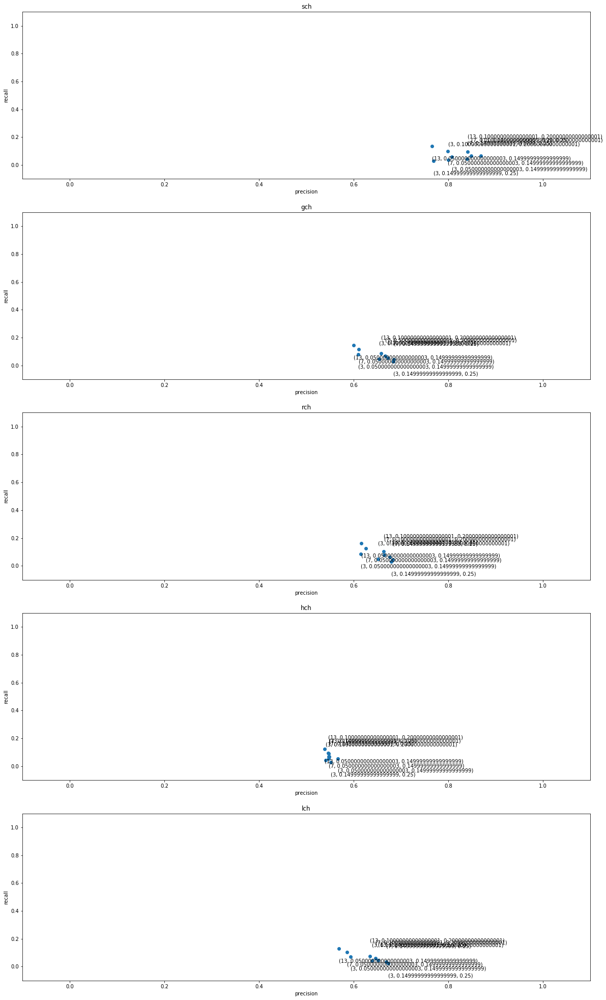

In [29]:
analyze_thresh_stats(ABS_GRADIENT_THRESH_STATS)

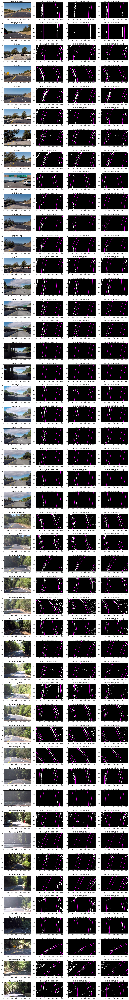

In [54]:
def abs_sobel_thresh_test_images():
    configs = [(3, (0.020, 0.070), (0.020, 0.075)),
               (3, (0.020, 0.070), (0.025, 0.100)),
               (3, (0.020, 0.070), (0.030, 0.125))]
    
    fig, axes = plt.subplots(ncols=(len(configs) + 1), nrows=len(TEST_IMAGE_SOLUTIONS), figsize=(20, 3.5 * len(TEST_IMAGE_SOLUTIONS)))
    
    for (warp_category, image_path, ploty, l_plotx_mid, l_plotx_lo, l_plotx_hi, r_plotx_mid, r_plotx_lo, r_plotx_hi), axs in zip(TEST_IMAGE_SOLUTIONS, axes):
        orig_rgb = cv2.imread(image_path)[:,:,::-1]
        undistorted_rgb = undistort(orig_rgb)
        undistorted_hls = cv2.cvtColor(undistorted_rgb, cv2.COLOR_RGB2HLS)
        rch = undistorted_rgb[:,:,0]
        sch = undistorted_hls[:,:,2]
        
        axs[0].imshow(undistorted_rgb)
        axs[0].set_title(os.path.basename(image_path))
        
        for config, ax in zip(configs, axs[1:]):
            ksize, (rch_xlo, rch_ylo), (sch_xlo, sch_ylo) = config
            
            rch_sobel_x = sobel(rch, 'x', ksize)
            rch_sobel_y = sobel(rch, 'y', ksize)
            rch_abs_sobel_x = abs_sobel_thresh(rch_sobel_x, rch_xlo)
            rch_abs_sobel_y = abs_sobel_thresh(rch_sobel_y, rch_ylo)
            
            sch_sobel_x = sobel(sch, 'x', ksize)
            sch_sobel_y = sobel(sch, 'y', ksize)
            sch_abs_sobel_x = abs_sobel_thresh(sch_sobel_x, sch_xlo)
            sch_abs_sobel_y = abs_sobel_thresh(sch_sobel_y, sch_ylo)

            bin_combined = np.zeros(undistorted_rgb.shape[:2], dtype=np.uint8)
            bin_combined[(rch_abs_sobel_x + rch_abs_sobel_y) +
                         (sch_abs_sobel_x + sch_abs_sobel_y) == 4] = 1
            
            bin_warped = warp(bin_combined, WARPER_MATRICES[warp_category])
            
            ax.imshow(bin_warped, cmap='gray')
            for plotx in [l_plotx_lo, l_plotx_hi, r_plotx_lo, r_plotx_hi]:
                ax.plot(plotx, ploty, color=(1,0,1))
            ax.set_xlim((0, undistorted_rgb.shape[1]))
            ax.set_ylim((undistorted_rgb.shape[0], 0))
            ax.set_title(config)

abs_sobel_thresh_test_images()

### Gradient direction and magnitude (L2 mean)

In [39]:
def mag_sobel_thresh(sobelx, sobely, x_y_ratio, thresh_lo):
    """
    The gradient value at a given point is the L2 mean of weighted x and y gradients.
    `x_y_ratio` is the weight of x gradient, whereas the weight of y gradient is always 1.
    `thresh_lo` indicates the mimimum proportion of the max gradient value to keep,
    and is a float between 0 and 1."""
    
    gradmag = np.sqrt((sobelx ** 2) * x_y_ratio + sobely ** 2)
    thresh_lo = np.max(gradmag) * thresh_lo
    binary_output = np.zeros_like(gradmag, dtype=np.uint8)
    binary_output[(gradmag >= thresh_lo)] = 1
    return binary_output

def dir_sobel_thresh(sobelx, sobely, thresh_lo, thresh_hi):
    """`thresh_lo` and `thresh_hi` are in radians."""
    
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir, dtype=np.uint8)
    binary_output[(absgraddir >= thresh_lo) & (absgraddir <= thresh_hi)] = 1
    return binary_output

In [40]:
# Skip the precision and recall analysis; it takes too long, and it was not needed to get started below.

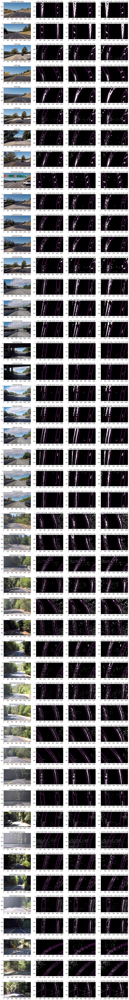

In [53]:
def dirmag_sobel_thresh_test_images():
    configs = [( 3, 1.0, 0.060, -1, 0.020, 0.7, 1.2),
               ( 7, 1.0, 0.060, -1, 0.020, 0.7, 1.2),
               (11, 1.0, 0.060, -1, 0.020, 0.7, 1.2)]
    
    fig, axes = plt.subplots(ncols=(len(configs) + 1), nrows=len(TEST_IMAGE_SOLUTIONS), figsize=(20, 3.5 * len(TEST_IMAGE_SOLUTIONS)))
    
    for (warp_category, image_path, ploty, l_plotx_mid, l_plotx_lo, l_plotx_hi, r_plotx_mid, r_plotx_lo, r_plotx_hi), axs in zip(TEST_IMAGE_SOLUTIONS, axes):
        orig_rgb = cv2.imread(image_path)[:,:,::-1]
        undistorted_rgb = undistort(orig_rgb)
        undistorted_hls = cv2.cvtColor(undistorted_rgb, cv2.COLOR_RGB2HLS)
        rch = undistorted_rgb[:,:,0]
#         hch = undistorted_hls[:,:,0]
        sch = undistorted_hls[:,:,2]
        
        axs[0].imshow(undistorted_rgb)
        axs[0].set_title(os.path.basename(image_path))
        
        for config, ax in zip(configs, axs[1:]):
            ksize, x_y_ratio, rch_maglo, hch_maglo, sch_maglo, dirlo, dirhi = config
            
            rch_sobel_x = sobel(rch, 'x', ksize)
            rch_sobel_y = sobel(rch, 'y', ksize)
            rch_bin_mag = mag_sobel_thresh(rch_sobel_x, rch_sobel_y, x_y_ratio, rch_maglo)
            rch_bin_dir = dir_sobel_thresh(rch_sobel_x, rch_sobel_y, dirlo, dirhi)
            
#             hch_sobel_x = sobel(hch, 'x', ksize)
#             hch_sobel_y = sobel(hch, 'y', ksize)
#             hch_bin_mag = mag_sobel_thresh(hch_sobel_x, hch_sobel_y, x_y_ratio, hch_maglo)
#             hch_bin_dir = dir_sobel_thresh(hch_sobel_x, hch_sobel_y, dirlo, dirhi)
            
            sch_sobel_x = sobel(sch, 'x', ksize)
            sch_sobel_y = sobel(sch, 'y', ksize)
            sch_bin_mag = mag_sobel_thresh(sch_sobel_x, sch_sobel_y, x_y_ratio, sch_maglo)
            sch_bin_dir = dir_sobel_thresh(sch_sobel_x, sch_sobel_y, dirlo, dirhi)
            
            bin_combined = np.zeros(undistorted_rgb.shape[:2], dtype=np.uint8)
            bin_combined[(rch_bin_mag + rch_bin_dir +
#                           hch_bin_mag + hch_bin_dir +
                          sch_bin_mag + sch_bin_dir) == 4] = 1
            
            bin_warped = warp(bin_combined, WARPER_MATRICES[warp_category])
            
            ax.imshow(bin_warped, cmap='gray')
            for plotx in [l_plotx_lo, l_plotx_hi, r_plotx_lo, r_plotx_hi]:
                ax.plot(plotx, ploty, color=(1,0,1))
            ax.set_xlim((0, undistorted_rgb.shape[1]))
            ax.set_ylim((undistorted_rgb.shape[0], 0))
            ax.set_title(', '.join('{:.2f}'.format(x) for x in config))

dirmag_sobel_thresh_test_images()